In [1]:
!pip install pandas matplotlib --q


[notice] A new release of pip is available: 23.0.1 -> 25.2
[notice] To update, run: pip install --upgrade pip


In [2]:
import pandas as pd
import matplotlib.pyplot as plt


In [ ]:
# Load data
df = pd.read_csv("data/point.csv", low_memory=False)

In [4]:
df.head()

,packet_index,point_index,x,y,z,intensity,azimuth_deg,ring,velodyne_timestamp_us,firing_time_us,pps_status_point,host_epoch_s,host_clock,host_clock_ms,host_date,host_monotonic_s,lidar_timestamp_us_packet,pps_status_packet,host_datetime
0,0,0,0.000000,0.000000,0.000000,2,99.67,0,0,0,1,1758134660,13:44:20,44:20.1,9/17/2025,94790.48051,NaN,NaN,44:20.1
1,0,1,3.313118,-0.235744,-0.057977,14,94.07,1,0,2,1,1758134660,13:44:20,44:20.1,9/17/2025,94790.48051,NaN,NaN,44:20.1
2,0,2,2.910796,-0.495983,-0.085933,15,99.67,2,0,4,1,1758134660,13:44:20,44:20.1,9/17/2025,94790.48051,NaN,NaN,44:20.1
3,0,3,3.137806,-0.378049,-0.884746,8,96.87,3,0,6,1,1758134660,13:44:20,44:20.1,9/17/2025,94790.48051,NaN,NaN,44:20.1
4,0,4,2.878678,-0.490510,-0.584037,21,99.67,4,0,9,1,1758134660,13:44:20,44:20.1,9/17/2025,94790.48051,NaN,NaN,44:20.1


In [5]:
df.columns

Index(['packet_index', 'point_index', 'x', 'y', 'z', 'intensity',
       'azimuth_deg', 'ring', 'velodyne_timestamp_us', 'firing_time_us',
       'pps_status_point', 'host_epoch_s', 'host_clock', 'host_clock_ms',
       'host_date', 'host_monotonic_s', 'lidar_timestamp_us_packet',
       'pps_status_packet', 'host_datetime'],
      dtype='object')

In [6]:
df.dtypes

packet_index                   int64
point_index                    int64
x                            float64
y                            float64
z                            float64
intensity                      int64
azimuth_deg                  float64
ring                           int64
velodyne_timestamp_us          int64
firing_time_us                 int64
pps_status_point               int64
host_epoch_s                   int64
host_clock                    object
host_clock_ms                 object
host_date                     object
host_monotonic_s             float64
lidar_timestamp_us_packet    float64
pps_status_packet            float64
host_datetime                 object
dtype: object

In [7]:
df.shape

(342144, 19)

In [8]:
df.tail()

,packet_index,point_index,x,y,z,intensity,azimuth_deg,ring,velodyne_timestamp_us,firing_time_us,pps_status_point,host_epoch_s,host_clock,host_clock_ms,host_date,host_monotonic_s,lidar_timestamp_us_packet,pps_status_packet,host_datetime
342139,890,379,0.216909,-0.221114,-0.012619,23,135.55,27,0,670,1,1758134670,13:44:29,44:29.7,9/17/2025,94800.07642,NaN,NaN,44:29.7
342140,890,380,0.197613,-0.271492,-0.011726,16,143.95,28,0,672,1,1758134670,13:44:29,44:29.7,9/17/2025,94800.07642,NaN,NaN,44:29.7
342141,890,381,0.207986,-0.233849,0.083857,22,138.35,29,0,675,1,1758134670,13:44:29,44:29.7,9/17/2025,94800.07642,NaN,NaN,44:29.7
342142,890,382,0.192538,-0.239042,0.055963,19,141.15,30,0,677,1,1758134670,13:44:29,44:29.7,9/17/2025,94800.07642,NaN,NaN,44:29.7
342143,890,383,0.211279,-0.237551,-0.007398,18,138.35,31,0,679,1,1758134670,13:44:29,44:29.7,9/17/2025,94800.07642,NaN,NaN,44:29.7


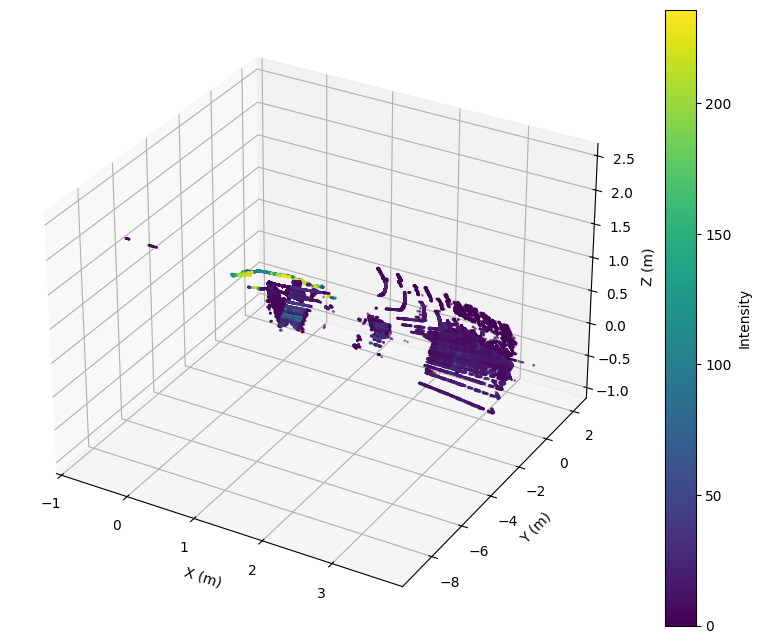

In [9]:
# 3D scatter plot of x,y,z colored by intensity
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")

sc = ax.scatter(
    df["x"], df["y"], df["z"],
    c=df["intensity"], cmap="viridis", s=1
)

ax.set_xlabel("X (m)")
ax.set_ylabel("Y (m)")
ax.set_zlabel("Z (m)")
fig.colorbar(sc, ax=ax, label="Intensity")

plt.show()

In [24]:
!pip install plotly


[notice] A new release of pip is available: 23.0.1 -> 25.2
[notice] To update, run: pip install --upgrade pip


In [26]:
import plotly.express as px
import plotly.graph_objects as go

# Nuage de points
fig = px.scatter_3d(
    df,
    x="x", y="y", z="z",
    color="intensity",
    size=[0.5]*len(df),     # points petits
    opacity=1.0
)

# === Ajouter un repère au centre (axes en rouge, vert, bleu) ===
axis_len = 5  # longueur du repère
fig.add_trace(go.Scatter3d(
    x=[0, axis_len], y=[0, 0], z=[0, 0],
    mode="lines", line=dict(color="red", width=5), name="X"
))
fig.add_trace(go.Scatter3d(
    x=[0, 0], y=[0, axis_len], z=[0, 0],
    mode="lines", line=dict(color="green", width=5), name="Y"
))
fig.add_trace(go.Scatter3d(
    x=[0, 0], y=[0, 0], z=[0, axis_len],
    mode="lines", line=dict(color="blue", width=5), name="Z"
))

# Mise en page (afficher axes + grille fine)
fig.update_layout(
    scene=dict(
        xaxis=dict(title="X", showbackground=False, showgrid=True),
        yaxis=dict(title="Y", showbackground=False, showgrid=True),
        zaxis=dict(title="Z", showbackground=False, showgrid=True)
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)

fig.show()


In [14]:
import open3d as o3d
print(o3d.__version__)


0.19.0


In [15]:
import open3d as o3d
import numpy as np



# Extraire coordonnées
points = df[["x", "y", "z"]].values

# Créer nuage de points
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(points)

# Colorier avec l’intensité
intensity = df["intensity"].values
intensity_norm = (intensity - intensity.min()) / (intensity.max() - intensity.min())
colors = plt.cm.viridis(intensity_norm)[:, :3]  # valeurs RGB [0,1]
pcd.colors = o3d.utility.Vector3dVector(colors)

# Affichage
o3d.visualization.draw_geometries([pcd])
